# Importações das biliotecas
As bibliotecas usadas nesse projeto estão listadas abaixo:

In [316]:
# Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

# Hipóteses

As hipóteses são uma ferramenta para guiar o pesquisador ou analisador na exploração e entendimento do problema apresentado, servindo como resposta provisória para este. Um problema pode apresentar mais de uma hipótese, podendo elas serem provadas como verdadeiras ou não. Ao definir hipóteses, você define até onde pretende chegar com sua análise, então é importante que, durante a pesquisa, busque-se dados que sutentem ou refutem a afirmativa feita na hipótese.¹

1. A maioria das músicas populares serão do gênero com maior predominância no dataframe;
2. A maioria das músicas populares não serão músicas com conteúdo explícito;
3. Maior parte das músicas populares serão do gênero pop.
4. A maioria das músicas populares serão uma música com "energy" e "danceability" altos.

# Análise Exploratória
A análise exploratória é uma das etapas da produção de um modelo de Machine Learning. O objetivo é descobrir padrões, correlações e tendências nos dados através de cálculos e observações de gráficos gerados.

Essa seção pretende explorar as bases de dados oferecidas e criar hipóteses sobre a relevância de cada uma das colunas, refletindo sobre a sua relevância para o resultado final. Além disso, pretende-se verificar quais os tratamentos ideais que os dados precisam passar, quais modelos funcionarão melhor para o sucesso da solução além de também verificar as hipóteses.

##### Leitura
Primeira etapa de tudo é ler os dataframes através da biblioteca pandas. 

In [317]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

Em seguida, são realizadas análises para visualizar dados e encontrar insights ou informações relevantes que ajudem na limpeza através de métodos como ```.info()```, ```.isnull()```, ```.duplicated()```, ```.value_counts()```, ```.shape()```, ```.describe()```, ```.unique()```, ```.head()```, ```.count(),```, ```.sort_values()```, ```.between()```. Além desses métodos de visualização de dataframe, foram também utilizados métodos para exibir gráficos que explorassem a relevância de algumas features específicas na popularidade.

In [318]:
test_df.info()
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34200 entries, 0 to 34199
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_unique_id   34200 non-null  int64  
 1   track_id          34200 non-null  object 
 2   artists           34199 non-null  object 
 3   album_name        34199 non-null  object 
 4   track_name        34199 non-null  object 
 5   duration_ms       34200 non-null  int64  
 6   explicit          34200 non-null  bool   
 7   danceability      34200 non-null  float64
 8   energy            34200 non-null  float64
 9   key               34200 non-null  int64  
 10  loudness          34200 non-null  float64
 11  mode              34200 non-null  int64  
 12  speechiness       34200 non-null  float64
 13  acousticness      34200 non-null  float64
 14  instrumentalness  34200 non-null  float64
 15  liveness          34200 non-null  float64
 16  valence           34200 non-null  float6

In [319]:
# Verifica se há valores nulos
print(test_df.isnull().sum())
print(train_df.isnull().sum())

track_unique_id     0
track_id            0
artists             1
album_name          1
track_name          1
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64
track_unique_id      0
track_id             0
artists              0
album_name           0
track_name           0
duration_ms          0
explicit             0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
track_genre          0
popularity_target    0
dtype: int64


In [320]:
# Verifica se há valores duplicados
print(train_df.duplicated().value_counts())
print(test_df.duplicated().value_counts())

False    79800
Name: count, dtype: int64
False    34200
Name: count, dtype: int64


In [321]:
# Verifica tamanho do df
print(train_df.shape)
print(test_df.shape)
print()

(79800, 21)
(34200, 20)



In [322]:
# Analisa as colunas
print(test_df.describe())
print(train_df.describe())

       track_unique_id   duration_ms  danceability        energy  \
count     34200.000000  3.420000e+04  34200.000000  34200.000000   
mean      56670.513889  2.283254e+05      0.565591      0.641041   
std       32710.184506  1.123471e+05      0.174544      0.251737   
min           3.000000  0.000000e+00      0.000000      0.000000   
25%       28612.500000  1.733250e+05      0.455000      0.472000   
50%       56475.500000  2.131775e+05      0.579000      0.683000   
75%       84855.750000  2.616720e+05      0.693000      0.853000   
max      113999.000000  4.730302e+06      0.980000      1.000000   

                key      loudness          mode   speechiness  acousticness  \
count  34200.000000  34200.000000  34200.000000  34200.000000  34200.000000   
mean       5.314035     -8.247806      0.637135      0.084423      0.314750   
std        3.554899      5.014973      0.480834      0.105910      0.332552   
min        0.000000    -49.531000      0.000000      0.000000      0.00

In [323]:
# Analisa componentes da coluna generos
df_genre = train_df['track_genre'].unique()
df_genre

array(['goth', 'opera', 'idm', 'classical', 'techno', 'pop', 'acoustic',
       'study', 'trance', 'progressive-house', 'dance', 'forro', 'mpb',
       'emo', 'kids', 'dubstep', 'dancehall', 'rockabilly', 'children',
       'cantopop', 'indie-pop', 'rock-n-roll', 'punk', 'black-metal',
       'pop-film', 'club', 'heavy-metal', 'hardcore', 'swedish', 'chill',
       'r-n-b', 'power-pop', 'trip-hop', 'piano', 'hip-hop', 'funk',
       'rock', 'hardstyle', 'j-dance', 'country', 'german', 'garage',
       'malay', 'deep-house', 'folk', 'death-metal', 'disney',
       'hard-rock', 'disco', 'indian', 'pagode', 'brazil',
       'minimal-techno', 'punk-rock', 'bluegrass', 'indie', 'spanish',
       'gospel', 'sleep', 'new-age', 'sertanejo', 'psych-rock', 'j-rock',
       'reggaeton', 'guitar', 'alternative', 'breakbeat', 'latino',
       'synth-pop', 'electronic', 'sad', 'alt-rock', 'songwriter',
       'party', 'reggae', 'detroit-techno', 'salsa', 'dub', 'british',
       'samba', 'blues', 'h

In [324]:
#lista a quantidade de gêneros diferentes
df_genre = train_df['track_genre'].unique()
len(df_genre)

114

In [325]:
# Analisa as dez primeiras linhas de maneira geral (só pra me certificar de que está tudo nos conformes com o dataframe)
train_df.head(10)

,track_unique_id,track_id,artists,album_name,track_name,duration_ms,explicit,danceability,energy,key,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target
0,41996,7hUhmkALyQ8SX9mJs5XI3D,Love and Rockets,Love and Rockets,Motorcycle,211533,False,0.305,0.8490,9,...,1,0.0549,0.000058,0.056700,0.4640,0.3200,141.793,4,goth,0
1,76471,5x59U89ZnjZXuNAAlc8X1u,Filippa Giordano,Filippa Giordano,"Addio del passato - From ""La traviata""",196000,False,0.287,0.1900,7,...,0,0.0370,0.930000,0.000356,0.0834,0.1330,83.685,4,opera,0
2,54809,70Vng5jLzoJLmeLu3ayBQq,Susumu Yokota,Symbol,Purple Rose Minuet,216506,False,0.583,0.5090,1,...,1,0.0362,0.777000,0.202000,0.1150,0.5440,90.459,3,idm,1
3,16326,1cRfzLJapgtwJ61xszs37b,Franz Liszt;YUNDI,Relajación y siestas,"Liebeslied (Widmung), S. 566",218346,False,0.163,0.0368,8,...,1,0.0472,0.991000,0.899000,0.1070,0.0387,69.442,3,classical,0
4,109799,47d5lYjbiMy0EdMRV8lRou,Scooter,Scooter Forever,The Darkside,173160,False,0.647,0.9210,2,...,1,0.1850,0.000939,0.371000,0.1310,0.1710,137.981,4,techno,0
5,81987,6m1TWFMeon7ai9XLOzdbiR,BTS,Love Yourself 轉 'Tear',FAKE LOVE,242333,False,0.557,0.7190,2,...,0,0.0371,0.002670,0.000000,0.3060,0.3450,77.502,4,pop,1
6,861,2hVaNGGvdvvzRPCK9BUZmA,Rosie Thomas;The Shins;Sufjan Stevens;Josh Ottum,Always Be My Baby,Always Be My Baby,254306,False,0.516,0.3110,1,...,1,0.0306,0.936000,0.000281,0.1070,0.5580,129.958,4,acoustic,1
7,105691,4XnOAcX5K9XojJC5o0MlqT,"Sarah, the Illstrumentalist",No Traffic in LA,Finally Out,130634,False,0.725,0.6320,6,...,0,0.0358,0.103000,0.951000,0.0847,0.3120,122.983,4,study,0
8,105515,0wwa9lg3yCKyyOkJLAEtod,Waveum,In The Third Move,Limewire,79764,False,0.830,0.2610,11,...,1,0.1000,0.638000,0.934000,0.1140,0.3410,85.009,4,study,0
9,110527,2spyaDFRS112FVYq9UZ6Xu,Dj T.H.;Mitraz,Chasing Stars,Chasing Stars - Extended Mix,354375,False,0.669,0.9180,0,...,0,0.0470,0.000981,0.026100,0.5210,0.3700,129.984,4,trance,0


O gráfico abaixo busca entender melhor a dristribuição dos valores das features numéricas pelo dataframe através da exibição de um histograma. Os métodos utlizados foram ```.add_trace()``` e ```.Histogram()``` para a construção.

In [326]:
# Exibe primeiro gráfico de análise geral de quantidade de valores por feature
fig=make_subplots(rows=3,cols=3,subplot_titles=('<i>explicit', '<i>danceability', '<i>energy', '<i>loudness', '<i>speechiness', '<i>acousticness', '<i>liveness', '<i>valence', '<i>tempo'))
fig.add_trace(go.Histogram(x=train_df['explicit'],name='explicit'),row=1,col=1)
fig.add_trace(go.Histogram(x=train_df['danceability'],name='danceability'),row=1,col=2)
fig.add_trace(go.Histogram(x=train_df['energy'],name='energy'),row=1,col=3)
fig.add_trace(go.Histogram(x=train_df['loudness'],name='loudness'),row=2,col=1)
fig.add_trace(go.Histogram(x=train_df['speechiness'],name='speechiness'),row=2,col=2)
fig.add_trace(go.Histogram(x=train_df['acousticness'],name='acousticness'),row=2,col=3)
fig.add_trace(go.Histogram(x=train_df['liveness'],name='liveness'),row=3,col=1)
fig.add_trace(go.Histogram(x=train_df['valence'],name='valence'),row=3,col=2)
fig.add_trace(go.Histogram(x=train_df['tempo'],name='tempo'),row=3,col=3)
fig.update_layout(height=900,width=900,title_text='<b>Distribuição por Feature')

O gráfico abaixo faz uma análise da coluna categórica para entender melhor a distribuição da quantidade de músicas por cada gênero musical presentes no dataframe. Essa análise busca entender a influência dessa feture no resultado final e contribui para a conclusão a respeito das hipóteses. Através dela foi possível identicar uma uma distribuição equilibrada da quantidade de músicas por gênero.


In [327]:
# Análise total de múscas por gênero
fig=px.histogram(train_df.groupby('track_genre',as_index=False).count().sort_values(by='track_unique_id',ascending=False),x='track_genre',y='track_unique_id',color_discrete_sequence=['green'], marginal='box',title='<b>Total songs based on genres</b>')
fig.update_layout(title_x=0.5)

Para realizar a análise sobre os gêneros musicais de forma mais profunda, eu escolhi codificar a feature 'track_genres' e relacionar as linhas codificadas com as linhas categoricas coletadas algumas células acima para o caso de ser necessário consultar o genero correspondente ao código. Em seguida, eu exibi um gráfico para avaliar a quantidade de músicas populares e não populares para cada gênero musical (por código de cada linha).
Para a codificação eu usei a classe ```LabelEncoder``` e para o gráfico, a biblioteca Plotly.

In [328]:
# Codifica a coluna gêneros apenas para plotar um gráfico para análise
le = LabelEncoder()
df_genre_codif = pd.read_csv('train.csv')
df_genre_codif['track_genres_codif'] = le.fit_transform(df_genre_codif['track_genre'])
df_genre_codif['track_genres_codif'].unique()

array([ 41,  76,  54,  16, 109,  80,   0, 105, 110,  83,  20,  35,  74,
        33,  66,  29,  21,  92,  14,  12,  57,  91,  85,   6,  81,  17,
        50,  48, 106,  15,  87,  82, 111,  79,  51,  37,  90,  49,  60,
        19,  39,  38,  69,  23,  34,  22,  26,  47,  25,  55,  77,   9,
        73,  86,   7,  56, 104,  40, 101,  75,  97,  84,  63,  89,  45,
         3,  10,  68, 107,  32,  94,   2, 102,  78,  88,  24,  95,  28,
        11,  96,   8,  46,  42,  36,  65,  72,  52,  58, 100,  71,  43,
        13,  59,  27,  98,  93,   4,  99, 108,  67,  61,  62,  18,  64,
       113,  70,  30,  31,   5,  53, 103,  44,   1, 112])

In [329]:
codigos = [
    41, 76, 54, 16, 109, 80, 0, 105, 110, 83, 20, 35, 74,
    33, 66, 29, 21, 92, 14, 12, 57, 91, 85, 6, 81, 17,
    50, 48, 106, 15, 87, 82, 111, 79, 51, 37, 90, 49,
    60, 19, 39, 38, 69, 23, 34, 22, 26, 47, 25, 55, 
    77, 9, 73, 86, 7, 56, 104, 40, 101, 75, 97, 84, 
    63, 89, 45, 3, 10, 68, 107, 32, 94, 2, 102, 78, 
    88, 24, 95, 28, 11, 96, 8, 46, 42, 36, 65, 72, 
    52, 58, 100, 71, 43, 13, 59, 27, 98, 93, 4, 99, 
    108, 67, 61, 62, 18, 64, 113, 70, 30, 31, 5, 53, 
    103, 44, 1, 112
]

generos = [
    'goth', 'opera', 'idm', 'classical', 'techno', 'pop', 
    'acoustic', 'study', 'trance', 'progressive-house', 
    'dance', 'forro', 'mpb', 'emo', 'kids', 'dubstep', 
    'dancehall', 'rockabilly', 'children', 'cantopop', 
    'indie-pop', 'rock-n-roll', 'punk', 'black-metal', 
    'pop-film', 'club', 'heavy-metal', 'hardcore', 
    'swedish', 'chill', 'r-n-b', 'power-pop', 'trip-hop', 
    'piano', 'hip-hop', 'funk', 'rock', 'hardstyle', 
    'j-dance', 'country', 'german', 'garage', 'malay', 
    'deep-house', 'folk', 'death-metal', 'disney', 
    'hard-rock', 'disco', 'indian', 'pagode', 'brazil', 
    'minimal-techno', 'punk-rock', 'bluegrass', 'indie', 
    'spanish', 'gospel', 'sleep', 'new-age', 'sertanejo', 
    'psych-rock', 'j-rock', 'reggaeton', 'guitar', 
    'alternative', 'breakbeat', 'latino', 'synth-pop', 
    'electronic', 'sad', 'alt-rock', 'songwriter', 
    'party', 'reggae', 'detroit-techno', 'salsa', 'dub', 
    'british', 'samba', 'blues', 'happy', 'grindcore', 
    'french', 'k-pop', 'metalcore', 'honky-tonk', 
    'industrial', 'ska', 'metal', 'groove', 'chicago-house', 
    'iranian', 'drum-and-bass', 'show-tunes', 'romance', 
    'ambient', 'singer-songwriter', 'tango', 'latin', 
    'j-idol', 'j-pop', 'comedy', 'jazz', 'world-music', 
    'mandopop', 'edm', 'electro', 'anime', 'house', 
    'soul', 'grunge', 'afrobeat', 'turkish'
]

df_generos = pd.DataFrame({
    'Código': codigos,
    'Gênero': generos
})

df_generos.sort_values(by='Código').reset_index(drop=True)


,Código,Gênero
0,0,acoustic
1,1,afrobeat
2,2,alt-rock
3,3,alternative
4,4,ambient
...,...,...
109,109,techno
110,110,trance
111,111,trip-hop
112,112,turkish


In [357]:
df_generos.loc[df_generos['Código'] == 94]

,Código,Gênero
70,94,sad


In [331]:
# Avalia a quantidade de músicas populares por gênero
filtered_df = df_genre_codif[df_genre_codif['track_genres_codif'].between(0, 113)]
count_by_genre = filtered_df.groupby(['track_genres_codif', 'popularity_target']).size().unstack(fill_value=0)

count_by_genre = count_by_genre.reset_index()
count_by_genre.columns.name = None
count_by_genre.columns = ['track_genres_codif', 'count_0', 'count_1']

fig = px.bar(
    count_by_genre,
    x='track_genres_codif',
    y=['count_0', 'count_1'],
    title='Quantidade de Músicas Populares por Gênero (0-113)',
    labels={'value': 'Número de Músicas', 'track_genres_codif': 'Gênero'},
    barmode='group'
)

fig.show()

O gráfico abaixo surge com o objetivo de analisar a influência do conteúdo explícito na popularidade de uma música utilizando um gráfico de barras.

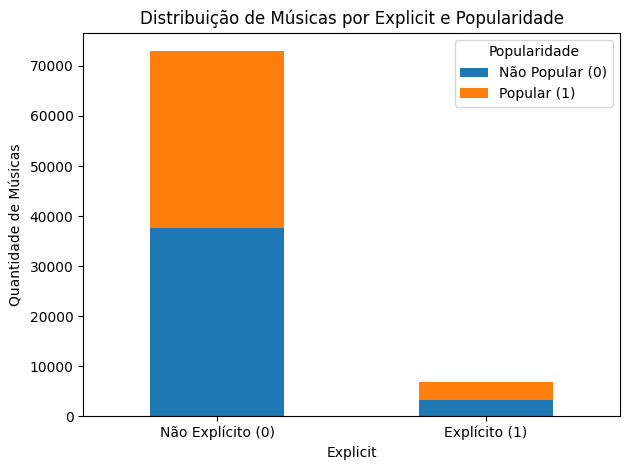

In [332]:
counts = train_df.groupby(['explicit', 'popularity_target']).size().unstack(fill_value=0)

counts.plot(kind='bar', stacked=True)

plt.title('Distribuição de Músicas por Explicit e Popularidade')
plt.xlabel('Explicit')
plt.ylabel('Quantidade de Músicas')
plt.xticks(ticks=[0, 1], labels=['Não Explícito (0)', 'Explícito (1)'], rotation=0)
plt.legend(title='Popularidade', labels=['Não Popular (0)', 'Popular (1)'])
plt.tight_layout()

plt.show()

Em seguida, busquei entender a relação entre popularidade e dançabilidade com bibliotecas como matplotlib e seaborn. No hitograma plotei duas barras e delimitei onde julguei ser o ponto com maior densidade de músicas populares no gráfico, entre 0,4 e 0,8. Depois exibi um boxplot para saber exatamente em que faixa estava a concentração.

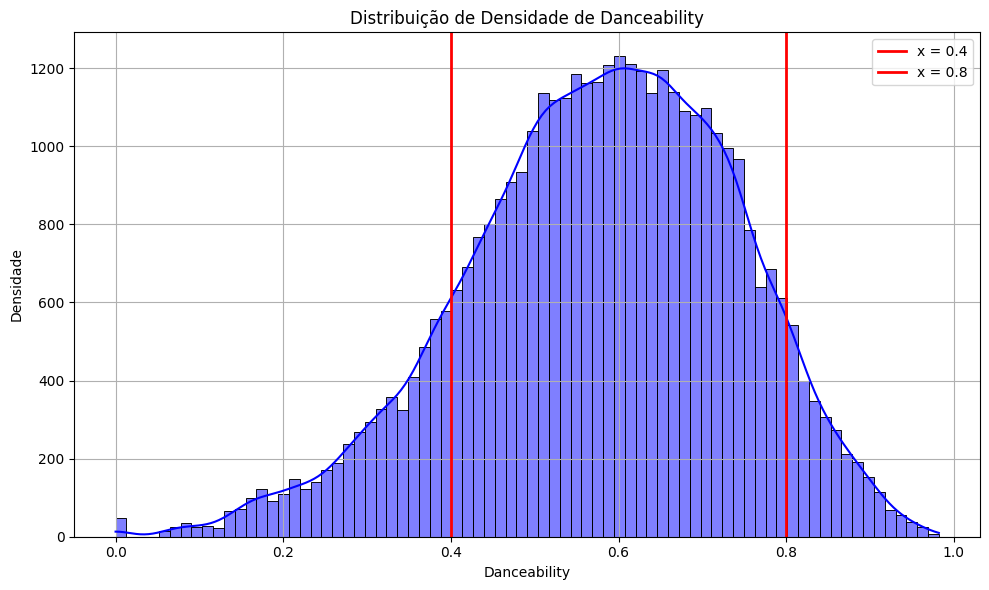

In [333]:
filtered_dance_df = train_df[(train_df['popularity_target'] == 1)]

plt.figure(figsize=(10, 6))
sns.histplot(filtered_dance_df['danceability'], color='blue', fill=True, kde = True)

# Adicionar linha vertical em x = 0.8 e 0,4
plt.axvline(x=0.4, color='red', linestyle='-', linewidth=2, label='x = 0.4')
plt.axvline(x=0.8, color='red', linestyle='-', linewidth=2, label='x = 0.8')

plt.title('Distribuição de Densidade de Danceability')
plt.xlabel('Danceability')
plt.ylabel('Densidade')
plt.grid(True)
plt.legend()
plt.tight_layout()

# Exibir o gráfico
plt.show()

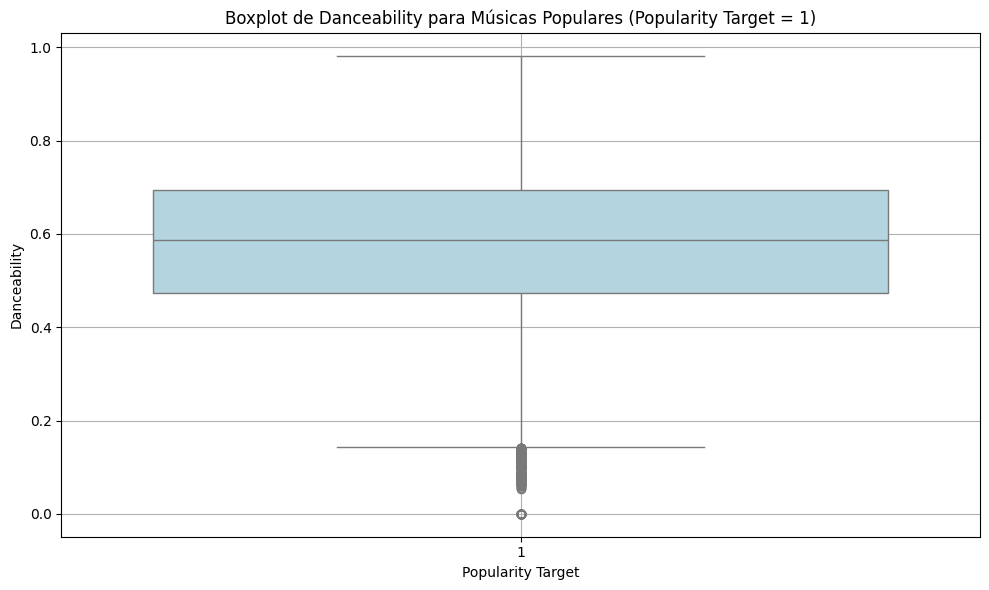

In [334]:
filtered_df = train_df[(train_df['popularity_target'] == 1)]

# Criar o boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x=filtered_df['popularity_target'], y=filtered_df['danceability'], color='lightblue')

# Adicionar título e rótulos
plt.title('Boxplot de Danceability para Músicas Populares (Popularity Target = 1)')
plt.xlabel('Popularity Target')
plt.ylabel('Danceability')
plt.xticks([0], ['1'])  # Ajustar o rótulo do eixo x
plt.grid(True)

# Exibir o gráfico
plt.tight_layout()
plt.show()

Em seguida, fiz a mesma análise para a feature 'energy', levando em consideração os mesmos fatores.

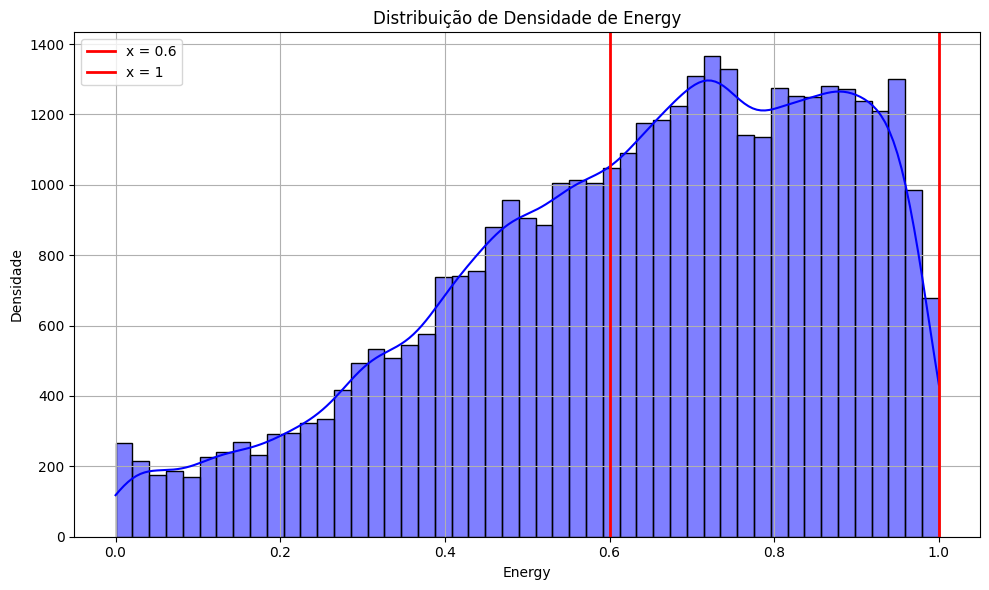

In [335]:
filtered_energy_df = train_df[(train_df['popularity_target'] == 1)]

# Criar o gráfico de densidade
plt.figure(figsize=(10, 6))
sns.histplot(filtered_energy_df['energy'], color='blue', fill=True, kde = True)

# Adicionar linha vertical em x = 0.6 e 1
plt.axvline(x=0.6, color='red', linestyle='-', linewidth=2, label='x = 0.6')
plt.axvline(x=1, color='red', linestyle='-', linewidth=2, label='x = 1')

plt.title('Distribuição de Densidade de Energy')
plt.xlabel('Energy')
plt.ylabel('Densidade')
plt.grid(True)
plt.legend()
plt.tight_layout()

# Exibir o gráfico
plt.show()

Diferente da análise de boxplot anterior, esse boxplot não possui outliers e indica que grande parte das músicas populares possuem um 'energy' numa faixa de ≈ 4,5 a 8,0.

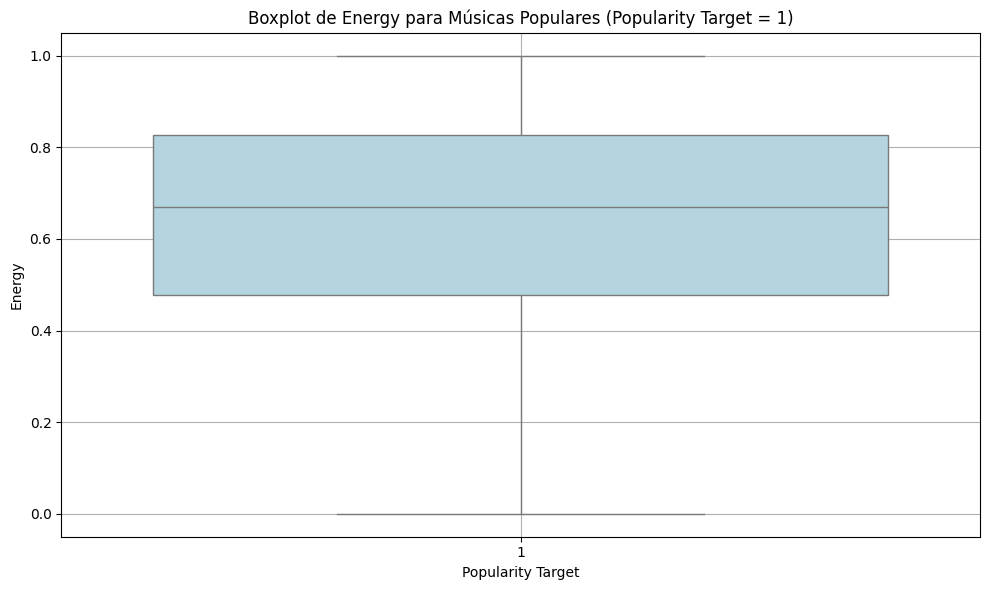

In [336]:
filtered_df = train_df[(train_df['popularity_target'] == 1)]

# Criar o boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x=filtered_df['popularity_target'], y=filtered_df['energy'], color='lightblue')

# Adicionar título e rótulos
plt.title('Boxplot de Energy para Músicas Populares (Popularity Target = 1)')
plt.xlabel('Popularity Target')
plt.ylabel('Energy')
plt.xticks([0], ['1'])  # Ajustar o rótulo do eixo x
plt.grid(True)

# Exibir o gráfico
plt.tight_layout()
plt.show()

Utilizei o gráfico abaixo para ter insights sobre a influência de uma feature na outra.

In [337]:
px.scatter(train_df,x='energy',y='danceability',color='danceability',color_continuous_scale=px.colors.sequential.Viridis, title='<b>Energy Versus Danceability')

# Limpeza e Tratamento de Valores Nulo, Codificação de Variáveis Categóricas e Seleção de Features
A limpeza de dados tem como principal função preparar os dados para a modelagem. Após seleção das hipóteses e exploração, é necessário limpar os dados obtidos, fazer a seleção de fetures, codificar as features categóricas que serão usadas. Essa seção é importante para garantir a qualidade e integridade dos dados que serão utilizados no modelo



Abaixo verifico se não há algum erro no dataframe original, como alguma coluna utilizada apenas para análise e que não deveria estar aqui.

In [338]:
train_df.head()

,track_unique_id,track_id,artists,album_name,track_name,duration_ms,explicit,danceability,energy,key,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target
0,41996,7hUhmkALyQ8SX9mJs5XI3D,Love and Rockets,Love and Rockets,Motorcycle,211533,False,0.305,0.8490,9,...,1,0.0549,0.000058,0.056700,0.4640,0.3200,141.793,4,goth,0
1,76471,5x59U89ZnjZXuNAAlc8X1u,Filippa Giordano,Filippa Giordano,"Addio del passato - From ""La traviata""",196000,False,0.287,0.1900,7,...,0,0.0370,0.930000,0.000356,0.0834,0.1330,83.685,4,opera,0
2,54809,70Vng5jLzoJLmeLu3ayBQq,Susumu Yokota,Symbol,Purple Rose Minuet,216506,False,0.583,0.5090,1,...,1,0.0362,0.777000,0.202000,0.1150,0.5440,90.459,3,idm,1
3,16326,1cRfzLJapgtwJ61xszs37b,Franz Liszt;YUNDI,Relajación y siestas,"Liebeslied (Widmung), S. 566",218346,False,0.163,0.0368,8,...,1,0.0472,0.991000,0.899000,0.1070,0.0387,69.442,3,classical,0
4,109799,47d5lYjbiMy0EdMRV8lRou,Scooter,Scooter Forever,The Darkside,173160,False,0.647,0.9210,2,...,1,0.1850,0.000939,0.371000,0.1310,0.1710,137.981,4,techno,0


Descarto as colunas que não serão relevantes para o modelo de acordo com as análises feitas.

In [339]:
train_df = train_df.drop(columns=['track_id', 'track_name'])
test_df = test_df.drop(columns=['track_id', 'track_name'])

Verifico o resultado da ação no dataframe.

In [340]:
train_df.head()

,track_unique_id,artists,album_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target
0,41996,Love and Rockets,Love and Rockets,211533,False,0.305,0.8490,9,-10.795,1,0.0549,0.000058,0.056700,0.4640,0.3200,141.793,4,goth,0
1,76471,Filippa Giordano,Filippa Giordano,196000,False,0.287,0.1900,7,-12.030,0,0.0370,0.930000,0.000356,0.0834,0.1330,83.685,4,opera,0
2,54809,Susumu Yokota,Symbol,216506,False,0.583,0.5090,1,-9.661,1,0.0362,0.777000,0.202000,0.1150,0.5440,90.459,3,idm,1
3,16326,Franz Liszt;YUNDI,Relajación y siestas,218346,False,0.163,0.0368,8,-23.149,1,0.0472,0.991000,0.899000,0.1070,0.0387,69.442,3,classical,0
4,109799,Scooter,Scooter Forever,173160,False,0.647,0.9210,2,-7.294,1,0.1850,0.000939,0.371000,0.1310,0.1710,137.981,4,techno,0


Realizo a limpeza das colunas numéricas removendo outliers.

In [341]:
col_mumericas = ['danceability', 'energy', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature', 'key', 'loudness']

outliers = train_df[col_mumericas].quantile(0.975)

for col in col_mumericas:
    train_df = train_df[train_df[col] <= outliers[col]]

Removo as colunas 'popularity_target' e 'track_unique_id' para fazer o tratamento e normalização dos dados numéricos.

In [342]:
col_mumericas = train_df.select_dtypes(include=np.number).columns
col_mumericas = col_mumericas.drop(['popularity_target','track_unique_id'])
print(col_mumericas)

Index(['duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature'],
      dtype='object')


Esse código realiza a normalização dos dados númericos em um intervalo de 0 e 1. 

In [343]:
minmaxs = MinMaxScaler() 
train_df[col_mumericas] = minmaxs.fit_transform(train_df[col_mumericas])
test_df[col_mumericas] = minmaxs.transform(test_df[col_mumericas])

In [344]:
train_df

,track_unique_id,artists,album_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target
0,41996,Love and Rockets,Love and Rockets,0.036504,False,0.353418,0.863680,0.818182,0.820889,1.0,0.152925,0.000059,0.060707,0.553699,0.337197,0.780145,1.00,goth,0
1,76471,Filippa Giordano,Filippa Giordano,0.033526,False,0.332561,0.193270,0.636364,0.794565,0.0,0.103064,0.948012,0.000381,0.099523,0.140148,0.460435,1.00,opera,0
2,54809,Susumu Yokota,Symbol,0.037458,False,0.675550,0.517793,0.090909,0.845060,1.0,0.100836,0.792049,0.216274,0.137232,0.573235,0.497706,0.75,idm,1
4,109799,Scooter,Scooter Forever,0.029148,False,0.749710,0.936927,0.181818,0.895513,1.0,0.515320,0.000957,0.397216,0.156325,0.180190,0.759172,1.00,techno,0
5,81987,BTS,Love Yourself 轉 'Tear',0.042409,False,0.645423,0.731429,0.181818,0.954748,0.0,0.103343,0.002722,0.000000,0.365155,0.363541,0.426416,1.00,pop,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79795,76820,Amilcare Ponchielli;Gothenburg Symphony Orches...,"Ballet Highlights - The Nutcracker, Romeo & Ju...",0.027126,False,0.641947,0.007742,0.363636,0.399467,1.0,0.139833,0.932722,0.001039,0.263723,0.164384,0.657500,1.00,opera,1
79796,110268,Sajanka,Time of India,0.041974,False,0.798378,0.563572,0.818182,0.876202,1.0,0.211421,0.092762,0.978587,0.103461,0.171760,0.814307,1.00,trance,0
79797,103694,Frankie Valli & The Four Seasons,Merry Christmas,0.022082,False,0.728853,0.569676,0.000000,0.806821,0.0,0.145682,0.606524,0.000000,0.217184,0.927292,0.654161,0.75,soul,0
79798,860,The Mayries,I Will Wait,0.037522,False,0.487833,0.108833,0.545455,0.727187,1.0,0.093315,0.966361,0.000000,0.105131,0.124341,0.573408,1.00,acoustic,1


O código abaixo codifica a coluna explicit de ```boolean``` para ```int```

In [345]:
train_df['explicit'] = train_df['explicit'].astype(int)
test_df['explicit'] = test_df['explicit'].astype(int)

Verifica a efetivção da mudança.

In [346]:
train_df

,track_unique_id,artists,album_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target
0,41996,Love and Rockets,Love and Rockets,0.036504,0,0.353418,0.863680,0.818182,0.820889,1.0,0.152925,0.000059,0.060707,0.553699,0.337197,0.780145,1.00,goth,0
1,76471,Filippa Giordano,Filippa Giordano,0.033526,0,0.332561,0.193270,0.636364,0.794565,0.0,0.103064,0.948012,0.000381,0.099523,0.140148,0.460435,1.00,opera,0
2,54809,Susumu Yokota,Symbol,0.037458,0,0.675550,0.517793,0.090909,0.845060,1.0,0.100836,0.792049,0.216274,0.137232,0.573235,0.497706,0.75,idm,1
4,109799,Scooter,Scooter Forever,0.029148,0,0.749710,0.936927,0.181818,0.895513,1.0,0.515320,0.000957,0.397216,0.156325,0.180190,0.759172,1.00,techno,0
5,81987,BTS,Love Yourself 轉 'Tear',0.042409,0,0.645423,0.731429,0.181818,0.954748,0.0,0.103343,0.002722,0.000000,0.365155,0.363541,0.426416,1.00,pop,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79795,76820,Amilcare Ponchielli;Gothenburg Symphony Orches...,"Ballet Highlights - The Nutcracker, Romeo & Ju...",0.027126,0,0.641947,0.007742,0.363636,0.399467,1.0,0.139833,0.932722,0.001039,0.263723,0.164384,0.657500,1.00,opera,1
79796,110268,Sajanka,Time of India,0.041974,0,0.798378,0.563572,0.818182,0.876202,1.0,0.211421,0.092762,0.978587,0.103461,0.171760,0.814307,1.00,trance,0
79797,103694,Frankie Valli & The Four Seasons,Merry Christmas,0.022082,0,0.728853,0.569676,0.000000,0.806821,0.0,0.145682,0.606524,0.000000,0.217184,0.927292,0.654161,0.75,soul,0
79798,860,The Mayries,I Will Wait,0.037522,0,0.487833,0.108833,0.545455,0.727187,1.0,0.093315,0.966361,0.000000,0.105131,0.124341,0.573408,1.00,acoustic,1


A caixa de código abaixo realiza o processo de codificação das colunas categóricas com o label encoder.

In [347]:
def label_encoder(train_df, test_df, column):
    encoder = LabelEncoder()
    #Trata os dois dataframes
    train_codificado = encoder.fit_transform(train_df[column])
    test_codificado = pd.Series(-1, index=test_df.index) 
    
    # Especifica os valores selecionados
    mask = test_df[column].isin(encoder.classes_)
    test_codificado[mask] = encoder.transform(test_df[column][mask]) 
    
    return train_codificado, test_codificado

# Aciona a função
train_codificado, test_codificado = label_encoder(train_df, test_df, 'artists')

# Atribui os resultados aos dataframes originais
train_df['artists_codificado'] = train_codificado
test_df['artists_codificado'] = test_codificado

Verifica alterações

In [348]:
train_df

,track_unique_id,artists,album_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,popularity_target,artists_codificado
0,41996,Love and Rockets,Love and Rockets,0.036504,0,0.353418,0.863680,0.818182,0.820889,1.0,0.152925,0.000059,0.060707,0.553699,0.337197,0.780145,1.00,goth,0,11370
1,76471,Filippa Giordano,Filippa Giordano,0.033526,0,0.332561,0.193270,0.636364,0.794565,0.0,0.103064,0.948012,0.000381,0.099523,0.140148,0.460435,1.00,opera,0,6549
2,54809,Susumu Yokota,Symbol,0.037458,0,0.675550,0.517793,0.090909,0.845060,1.0,0.100836,0.792049,0.216274,0.137232,0.573235,0.497706,0.75,idm,1,18085
4,109799,Scooter,Scooter Forever,0.029148,0,0.749710,0.936927,0.181818,0.895513,1.0,0.515320,0.000957,0.397216,0.156325,0.180190,0.759172,1.00,techno,0,16800
5,81987,BTS,Love Yourself 轉 'Tear',0.042409,0,0.645423,0.731429,0.181818,0.954748,0.0,0.103343,0.002722,0.000000,0.365155,0.363541,0.426416,1.00,pop,1,1973
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79795,76820,Amilcare Ponchielli;Gothenburg Symphony Orches...,"Ballet Highlights - The Nutcracker, Romeo & Ju...",0.027126,0,0.641947,0.007742,0.363636,0.399467,1.0,0.139833,0.932722,0.001039,0.263723,0.164384,0.657500,1.00,opera,1,1014
79796,110268,Sajanka,Time of India,0.041974,0,0.798378,0.563572,0.818182,0.876202,1.0,0.211421,0.092762,0.978587,0.103461,0.171760,0.814307,1.00,trance,0,16485
79797,103694,Frankie Valli & The Four Seasons,Merry Christmas,0.022082,0,0.728853,0.569676,0.000000,0.806821,0.0,0.145682,0.606524,0.000000,0.217184,0.927292,0.654161,0.75,soul,0,6773
79798,860,The Mayries,I Will Wait,0.037522,0,0.487833,0.108833,0.545455,0.727187,1.0,0.093315,0.966361,0.000000,0.105131,0.124341,0.573408,1.00,acoustic,1,18883


In [349]:
test_df

,track_unique_id,artists,album_name,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,artists_codificado
0,113186,Hillsong Worship,No Other Name,0.080351,0,0.427578,0.608334,0.636364,0.902121,1.0,0.084680,0.005209,0.000000,0.210024,0.049104,0.814373,1.00,world-music,8051
1,42819,Internal Rot,Grieving Birth,0.013959,0,0.198146,1.014242,0.636364,0.974550,1.0,0.328691,0.005311,0.857602,0.501193,0.030980,0.672471,1.00,grindcore,8591
2,59311,Zhoobin Askarieh;Ali Sasha,Noise A Noise 20.4-1,0.036896,0,0.200463,0.816883,0.818182,0.836321,0.0,0.401114,0.624873,0.002045,0.232697,0.093467,0.415753,0.75,iranian,21061
3,91368,Bryan Adams,All I Want For Christmas Is You,0.024974,0,0.791425,0.519828,0.545455,0.931664,1.0,0.077716,0.413863,0.000211,0.132458,0.630137,0.605171,0.75,rock,2980
4,61000,Nogizaka46,バレッタ TypeD,0.041251,0,0.643105,0.957273,0.818182,0.980774,0.0,0.133983,0.493374,0.000000,0.317422,0.856691,0.508864,1.00,j-idol,13767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34195,39480,Mickie Krause,Ballermann Hits Party 2023,0.037485,0,0.691773,0.996948,0.636364,1.006757,1.0,0.177159,0.004353,0.000038,0.349642,0.667018,0.770220,1.00,german,12717
34196,74692,Fábio Jr.,Mega Hits - Fábio Jr.,0.038030,0,0.526072,0.373334,0.000000,0.789854,1.0,0.079387,0.139653,0.000031,0.204057,0.149631,0.623102,1.00,mpb,6908
34197,53782,Imanbek;KDDK;KIDDO;Wiz Khalifa,Ordinary Life (KDDK Phonk Remix),0.027647,1,0.796060,0.930823,0.000000,1.022381,1.0,0.114485,0.021407,0.000007,0.180191,0.286617,0.494971,1.00,house,-1
34198,41890,The Gathering,If_then_else,0.052130,0,0.419467,0.679546,0.000000,0.846829,1.0,0.120334,0.000414,0.010064,0.156325,0.166491,0.672532,1.00,goth,18755


Para treinar o modelo, resolvi separar os dados entre X (dados de treino, y (dados da coluna alvo) e X_test (dados de teste)

In [351]:
X = train_df.drop(columns=['popularity_target', 'track_unique_id','artists','track_genre','album_name'])
y = train_df['popularity_target']
X_test = test_df.drop(columns=['track_unique_id','artists','track_genre','album_name'])

Nessa etapa eu dividi os conjuntos de treino e validação para então começar a construir o test e sumeter os dados ao modelo.

In [352]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Construção e Avaliação do Modelo

Nessa etapa cria-se o modelo e define-se as metas e os hiperparâmetros, objetivando garantir um número razoável de árvores, mínimo de overfitting, evitar divisões e reduzir a profundidade (ajuste em excesso)

In [353]:

modelo = RandomForestClassifier(
    n_estimators=100,        
    max_depth=30,             
    min_samples_split=2,  
    min_samples_leaf=1,    
    random_state=42,
    n_jobs=-1
) 

modelo.fit(X_train, y_train)
predic_valid = modelo.predict(X_valid)

# Essa etapa em específico avalia o modelo através das métricas de acurácia, precisão, recall e f1 
acuracia = accuracy_score(y_valid, predic_valid)
precisao = precision_score(y_valid, predic_valid, average='weighted')
recall = recall_score(y_valid, predic_valid, average='weighted')
f1 = f1_score(y_valid, predic_valid, average='weighted')

conf_matrix = confusion_matrix(y_valid, predic_valid)

print(f'Acurácia: {acuracia}')
print(f'Precisão: {precisao}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Matriz de confusão:\n{conf_matrix}')

Acurácia: 0.7653797865662273
Precisão: 0.7667638739029853
Recall: 0.7653797865662273
F1 Score: 0.764817948341051
Matriz de confusão:
[[2250  876]
 [ 619 2627]]


# Finetuning de Hiperparâmetros

Aqui aplicamos o ajuste fino pra aumentar a acurácia do modelo. Escolhi o Random search porque ele fazia mais sentido para mim, tanto por ser um modelo de análise mais ampla quanto pela sua agilidade em comparação a modelos como o gri search que é menos flexível e possui uma análise mais objetiva. O número de iterações escolhido também foi pensado no benefício de tempo. O scoring foi escolhido pensando no que é pedido da competição (valor mínimo de 70% de acurácia), mesmo que os outros valores também sejam avaliados.

In [354]:
modelo = RandomForestClassifier(
    n_jobs=-1,
    random_state=42
)

# Definindo o espaço de busca para hiperparâmetros
param_distributions = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

# Aqui configura-se o algorítmo de finetuning. O random search foi escolhido por ser rápido
random_search = RandomizedSearchCV(
    estimator=modelo,
    param_distributions=param_distributions,
    n_iter=50,               
    scoring='accuracy',       
    cv=3,                     
    verbose=2,
    random_state=42
)


random_search.fit(X_train, y_train)
melhor_modelo = random_search.best_estimator_

print(random_search.best_params_)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   1.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   1.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=50; total time=   1.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   1.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   1.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=50; total time=   1.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; to

c:\Users\Inteli\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning:


75 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
75 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Inteli\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Inteli\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\Inteli\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\b

Melhores parâmetros: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 30}


Aqui chegamos finalmente ao passo final, em que iremos treinar nosso modelo com o x (features) e y (popularity_target) estabelecidos anteriormente, submete-lo a x_test (dataframe com dados para test) e por fim, carregar no dataframe que será submetido na plataforma!

In [355]:

modelo.fit(X, y)

test_preds = modelo.predict(X_test)

submission = pd.DataFrame({
    'track_unique_id': test_df['track_unique_id'],  
    'popularity_target': test_preds.astype(int)  
})

submission_group = submission.groupby('track_unique_id', as_index=False).agg({
    'popularity_target': 'max'  
})

submission_group.to_csv('submission_sptf.csv', index=False)

# Apresentação dos Resultados

A partir das minhas análises, é possível inferir que algumas das hipóteses podem ser contestadas e outras confirmadas:

1. A maioria das músicas populares serão do gênero com maior predominância no dataframe;
- Através da análise de músicas populares por cada gênero músical, dois gêneros se destacaram com a maior quantidade de músicas populares: "gospel" e "sad" cada um com 701 músicas populares, contudo, o gênero com maior predominância no dataframe não é o que têm mais músicas populares (apesar de sad ser o segundo com maior quantidade de músicas), o que contesta essa hipótese.

2. A maioria das músicas populares não serão músicas com conteúdo explícito;
- Através da visualização do gráfico, é possível observar que as músicas populares e não populares estão muito bem distribuídas entre as músicas com conteúdo explicito e não explito, contudo, ainda assim, existe uma maior quantidade de músicas populares nas músicas sem conteúdo explícito. Logo, é possível afirmar que A maioria das músicas populares não serão músicas com conteúdo explícito.

3. Maior parte das músicas populares serão do gênero pop.
- No gráfico de distribuição de músicas por gênero, as músicas estão bem distribuídas, o que implica em uma média equilibrada e, consequentemente, pouca interferência na popularidade, ou seja, a variável gênero não é uma boa variável para determinar a popularidade de uma música.

4. A maioria das músicas populares serão uma música com "energy" e "danceability" altos.
- Após analisar o gráfico de dispersão das viáveis, os boxplot e os hitogramas de cada uma dessas variáveis pela popularidade, é possível perceber duas coisas: "energy" e "danceability" são variáveis independentes, ou seja, o resultado de uma não afeta a outra, contudo, ao observar os histogramas e boxplot, é possivel observar que as músicas populares em "energy" todas tem valores altos, o que nos indica que todas as músicas populares tem um valor alto de "energy", mas dentro de "danceability" encontrei outliers, o que indica que algumas músicas com "danceability" baixo também podem ser populares, no entanto, não calcuei esse percentual.

# Referências

1. VILELA JUNIOR, Guanis de Barros. O problema e a hipótese. 2008. Disponível em: https://www.cpaqv.org/metodologia/o_problema_e_a_hipotese.pdf. Acesso em: 1 out. 2024.